# 1. Introduction

## 1.1 Problem Description

Churn (loss of customers to competition) is a problem for companies because it is more expensive to acquire a new customer than to keep your existing one from leaving.This problem statement is targeted at enabling churn reduction using analytics concepts.

## 1.2 Problem Statement

The objective of this Case is to predict customer behaviour. We are provided with a public dataset that has customer usage pattern and if the customer has moved or not. We are expected  to develop an algorithm to predict the churn score based on usage pattern.

## 1.3 Data

Our task is to build classification models which will classify and predict the churn score based on the usage pattern and whether the customer will churn or not.<br>

We are provided with two csv files.<br>
 - Train Data
 - Test Data

Also, we are expected to built a classification model on train data and test the models performance on test data and report performance metrics on the same.

## 1.4 Performance Metric

As the data is imbalanced and almost 85.5% of data is negative labelled and 14.5% of data is postive labelled. We cannot take accuracy as our main 'performance metric' because even if our model is dumb, it can have pretty good accuracy.
According to the problem statement ,where we need to predict the customers who will 'churn', we are certain that we need to focus on Recall but we also need to take care of Precision. So, we need to find a trade off between Precision and Recall.
So, Our main performance metrics would be **Precision** and ** Recall**.

# 2. Exploratory Data Analysis

In [1]:
import os
os.chdir("/Users/akash/Desktop/Project 1 -Churn Reduction")

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from scipy.sparse import hstack
from sklearn.svm import SVC
from sklearn.cross_validation import StratifiedKFold 
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier

from mlxtend.classifier import StackingClassifier
from sklearn.preprocessing import StandardScaler

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest, SelectPercentile

/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


## 2.1 Reading Data

### 2.1.1 Reading train and test data

In [3]:
train_data = pd.read_csv("Train_data.csv")
test_data = pd.read_csv("Test_data.csv")

In [11]:
train_data.head(5)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,number customer service calls,Churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [12]:
pd.set_option('display.max_columns', None)

In [9]:
test_data.head(3)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,number customer service calls,Churn
0,HI,101,510,354-8815,no,no,0,70.9,123,12.05,211.9,73,18.01,236.0,73,10.62,10.6,3,2.86,3,False.
1,MT,137,510,381-7211,no,no,0,223.6,86,38.01,244.8,139,20.81,94.2,81,4.24,9.5,7,2.57,0,False.
2,OH,103,408,411-9481,no,yes,29,294.7,95,50.10,237.3,105,20.17,300.3,127,13.51,13.7,6,3.70,1,False.


In [10]:
train_data.shape , test_data.shape

((3333, 21), (1667, 21))

** Inference :** <br>
 - The Train data contains 3333 rows and 21 features
 - The Test data contains 1667 rows and 21 features

In [145]:
train_data.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'number customer service calls', 'Churn'],
      dtype='object')

In [146]:
test_data.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'number customer service calls', 'Churn'],
      dtype='object')

### 2.1.2 Renaming Column names

In [147]:
## Renaming 'train_data' column names
train_data.rename(columns={'account length': 'account_length', 'area code': 'area_code' ,'phone number': 'phone_number',\
                          'international plan' : 'international_plan', 'voice mail plan':'voice_mail_plan', \
                           'number vmail messages' : 'number_vmail_messages','total day minutes':'total_day_minutes', \
                           'total day calls':'total_day_calls', 'total day charge':'total_day_charge',\
                           'total eve minutes':'total_eve_minutes', 'total eve calls':'total_eve_calls', \
                           'total eve charge':'total_eve_charge','total night minutes':'total_night_minutes',\
                           'total night calls':'total_night_calls', 'total night charge':'total_night_charge',\
                           'total intl minutes':'total_intl_minutes', 'total intl calls':'total_intl_calls',\
                           'total intl charge' :'total_intl_charge',\
                           'number customer service calls':'number_customer_service_calls',\
                          }, inplace=True)

In [148]:
## Renaming 'test_data' column names
test_data.rename(columns={'account length': 'account_length', 'area code': 'area_code' ,'phone number': 'phone_number',\
                          'international plan' : 'international_plan', 'voice mail plan':'voice_mail_plan', \
                           'number vmail messages' : 'number_vmail_messages','total day minutes':'total_day_minutes', \
                           'total day calls':'total_day_calls', 'total day charge':'total_day_charge',\
                           'total eve minutes':'total_eve_minutes', 'total eve calls':'total_eve_calls', \
                           'total eve charge':'total_eve_charge','total night minutes':'total_night_minutes',\
                           'total night calls':'total_night_calls', 'total night charge':'total_night_charge',\
                           'total intl minutes':'total_intl_minutes', 'total intl calls':'total_intl_calls',\
                           'total intl charge' :'total_intl_charge',\
                           'number customer service calls':'number_customer_service_calls',\
                          }, inplace=True)

In [149]:
train_data.columns

Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'Churn'],
      dtype='object')

In [150]:
test_data.columns

Index(['state', 'account_length', 'area_code', 'phone_number',
       'international_plan', 'voice_mail_plan', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'Churn'],
      dtype='object')

## 2.2 Checking For Data Imbalance

In [151]:
train_data["Churn"].value_counts()

 False.    2850
 True.      483
Name: Churn, dtype: int64

/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


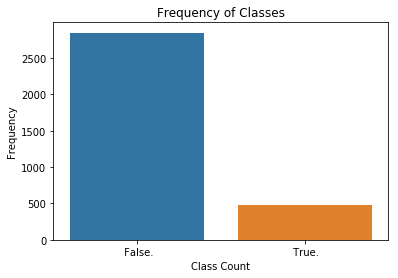

In [152]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


sns.countplot(x="Churn", data=train_data)
plt.ylabel('Frequency')
plt.xlabel('Class Count')
plt.title("Frequency of Classes")
plt.show()

In [153]:
test_data["Churn"].value_counts()

 False.    1443
 True.      224
Name: Churn, dtype: int64

/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:1460: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


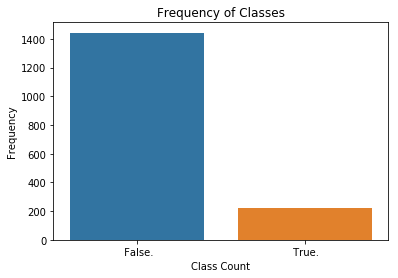

In [154]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns


sns.countplot(x="Churn", data=test_data)
plt.ylabel('Frequency')
plt.xlabel('Class Count')
plt.title("Frequency of Classes")
plt.show()

**Inference : ** It is obvious from the above visualisation that, the data (both the test and the train data) is imbalanced.
 - In Train_data :
         True : 483
         Flase : 2850
         
 - In test_data :
         True : 224
         False : 1443

 - Also, Negative Label (False) contributes to almost 85.5 percent of train data and Positive Label (True) contributes to only 14.5 percent of data in the train dataset.<br>

 - Also, Negative Label (False) contributes to almost 86.6 percent of test data and Positive Label (True) contributes to only 13.4 percent of data in the test dataset. <br>
         

## 2.3 Checking For Missing Values

#### Train Data

In [155]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
state                            3333 non-null object
account_length                   3333 non-null int64
area_code                        3333 non-null int64
phone_number                     3333 non-null object
international_plan               3333 non-null object
voice_mail_plan                  3333 non-null object
number_vmail_messages            3333 non-null int64
total_day_minutes                3333 non-null float64
total_day_calls                  3333 non-null int64
total_day_charge                 3333 non-null float64
total_eve_minutes                3333 non-null float64
total_eve_calls                  3333 non-null int64
total_eve_charge                 3333 non-null float64
total_night_minutes              3333 non-null float64
total_night_calls                3333 non-null int64
total_night_charge               3333 non-null float64
total_intl_minutes           

In [156]:
train_data.isnull().sum()

state                            0
account_length                   0
area_code                        0
phone_number                     0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
Churn                            0
dtype: int64

** Test Data**

In [157]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1667 entries, 0 to 1666
Data columns (total 21 columns):
state                            1667 non-null object
account_length                   1667 non-null int64
area_code                        1667 non-null int64
phone_number                     1667 non-null object
international_plan               1667 non-null object
voice_mail_plan                  1667 non-null object
number_vmail_messages            1667 non-null int64
total_day_minutes                1667 non-null float64
total_day_calls                  1667 non-null int64
total_day_charge                 1667 non-null float64
total_eve_minutes                1667 non-null float64
total_eve_calls                  1667 non-null int64
total_eve_charge                 1667 non-null float64
total_night_minutes              1667 non-null float64
total_night_calls                1667 non-null int64
total_night_charge               1667 non-null float64
total_intl_minutes           

In [158]:
train_data.isnull().sum()

state                            0
account_length                   0
area_code                        0
phone_number                     0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
Churn                            0
dtype: int64

** Inference : ** So, both of our **train data** and **test data** does not contain any missing values.

## 2.4 Data Statistics

In [159]:
train_data.describe()

,account_length,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [160]:
test_data.describe()

,account_length,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
count,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000,1667.000000
mean,98.646671,436.369526,7.067786,181.316197,99.217157,30.824337,199.949190,100.344331,16.995903,199.431074,99.542292,8.974559,10.310738,4.346731,2.784421,1.585483
std,39.400755,41.890588,13.235274,52.732174,19.327148,8.964421,50.232869,19.637935,4.269758,50.437010,20.717441,2.269604,2.699660,2.446252,0.728764,1.288179
min,1.000000,408.000000,0.000000,6.600000,34.000000,1.120000,22.300000,38.000000,1.900000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,72.000000,408.000000,0.000000,143.750000,86.000000,24.440000,165.900000,88.000000,14.100000,166.600000,86.000000,7.500000,8.600000,3.000000,2.320000,1.000000
50%,98.000000,415.000000,0.000000,181.000000,99.000000,30.770000,200.400000,100.000000,17.030000,199.400000,99.000000,8.970000,10.400000,4.000000,2.810000,1.000000
75%,126.000000,415.000000,0.000000,215.750000,112.000000,36.680000,232.300000,113.000000,19.745000,233.050000,113.000000,10.490000,12.000000,5.000000,3.240000,2.000000
max,238.000000,510.000000,52.000000,351.500000,160.000000,59.760000,359.300000,169.000000,30.540000,381.600000,170.000000,17.170000,19.700000,19.000000,5.320000,7.000000


## 2.5 Adding few more Variables to the data

It seems like, we can add few more features of our own to add some extra information to our dataset like 'total minutes' , 'total_calls' and 'total charge' that might add some extra information to the dataset.

**IN TRAIN DATA**

In [161]:
train_data['total_minutes'] = train_data['total_day_minutes'] + train_data['total_eve_minutes'] + train_data['total_night_minutes'] +\
                                       train_data['total_intl_minutes']
train_data['total_calls'] = train_data['total_day_calls'] + train_data['total_eve_calls'] + train_data['total_night_calls']+ \
                                     train_data['total_intl_calls']

train_data['total_charge'] = train_data['total_day_charge'] + train_data['total_eve_charge'] + train_data['total_night_charge']+ \
                                     train_data['total_intl_charge']


**IN TEST DATA**

In [162]:
test_data['total_minutes'] = test_data['total_day_minutes'] + test_data['total_eve_minutes'] + test_data['total_night_minutes'] +\
                                       test_data['total_intl_minutes']
test_data['total_calls'] = test_data['total_day_calls'] + test_data['total_eve_calls'] + test_data['total_night_calls']+ \
                                     test_data['total_intl_calls']

test_data['total_charge'] = test_data['total_day_charge'] + test_data['total_eve_charge'] + test_data['total_night_charge']+ \
                                     test_data['total_intl_charge']


## 2.6 Transforming Categorical Variable into numeric

In the train and test data given to us, 'international_plan' , 'Voice_mail_plan' and 'Churn' are categorical features. So, we convert them into numerical features by creating dummies for each of them also called one hot encoding.

**IN TRAIN DATA**

In [163]:
int_plan_dummies = pd.get_dummies(train_data.international_plan , drop_first=True , prefix = 'international_plan')
voice_mail_plan_dummies = pd.get_dummies(train_data.voice_mail_plan , drop_first=True , prefix = 'voice_mail_plan')
churn_dummies = pd.get_dummies(train_data.Churn , drop_first= True  )

In [164]:
train_data = pd.concat([train_data , int_plan_dummies], axis = 1)
train_data = pd.concat([train_data , voice_mail_plan_dummies], axis = 1)
train_data = pd.concat([train_data , churn_dummies], axis = 1)

In [165]:
#Deleting columns like 'international_plan' and 'voice_mail_plan'
train_data.drop('international_plan', axis=1, inplace=True)
train_data.drop('voice_mail_plan', axis=1, inplace=True)
train_data.drop('Churn', axis=1, inplace=True)

train_data.drop('state', axis=1, inplace=True)
train_data.drop('phone_number', axis=1, inplace=True)
train_data.drop('account_length', axis=1, inplace=True)


In [166]:
train_data.rename(columns={' True.' : 'Churn'}, inplace=True)

In [167]:
train_data.head(5)

,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,...,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,total_minutes,total_calls,total_charge,international_plan_ yes,voice_mail_plan_ yes,Churn
0,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,...,10.0,3,2.70,1,717.2,303,75.56,0,1,0
1,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,...,13.7,3,3.70,1,625.2,332,59.24,0,1,0
2,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,...,12.2,5,3.29,0,539.4,333,62.29,0,0,0
3,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,...,6.6,7,1.78,2,564.8,255,66.80,1,0,0
4,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,...,10.1,3,2.73,3,512.0,359,52.09,1,0,0


**IN TEST DATA**

In [168]:
int_plan_dummies = pd.get_dummies(test_data.international_plan , drop_first=True , prefix = 'international_plan')
voice_mail_plan_dummies = pd.get_dummies(test_data.voice_mail_plan , drop_first=True , prefix = 'voice_mail_plan')
churn_dummies = pd.get_dummies(test_data.Churn , drop_first=True , prefix = 'Churn')

In [169]:
test_data = pd.concat([test_data , int_plan_dummies], axis = 1)
test_data = pd.concat([test_data , voice_mail_plan_dummies], axis = 1)
test_data = pd.concat([test_data , churn_dummies], axis = 1)

In [170]:
#Deleting columns like 'international_plan' and 'voice_mail_plan'
test_data.drop('international_plan', axis=1, inplace=True)
test_data.drop('voice_mail_plan', axis=1, inplace=True)
test_data.drop('Churn', axis=1, inplace=True)
test_data.drop('state', axis=1, inplace=True)
test_data.drop('phone_number', axis=1, inplace=True)
test_data.drop('account_length', axis=1, inplace=True)


In [171]:
test_data.rename(columns={'Churn_ True.' : 'Churn'}, inplace=True)

In [172]:
test_data.head(5)

,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,...,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,total_minutes,total_calls,total_charge,international_plan_ yes,voice_mail_plan_ yes,Churn
0,510,0,70.9,123,12.05,211.9,73,18.01,236.0,73,...,10.6,3,2.86,3,529.4,272,43.54,0,0,0
1,510,0,223.6,86,38.01,244.8,139,20.81,94.2,81,...,9.5,7,2.57,0,572.1,313,65.63,0,0,0
2,408,29,294.7,95,50.10,237.3,105,20.17,300.3,127,...,13.7,6,3.70,1,846.0,333,87.48,0,1,0
3,415,0,216.8,123,36.86,126.4,88,10.74,220.6,82,...,15.7,2,4.24,1,579.5,295,61.77,0,0,0
4,415,0,197.4,78,33.56,124.0,101,10.54,204.5,107,...,7.7,4,2.08,2,533.6,290,55.38,0,0,0


We are dropping features like 'state' , 'phone_number' and 'account_length' because these features are irrelevant to our task and also converting categorical feature like 'state' into numerical feature will increase our feature space to around 60.

## 2.7 Splitting in train and test data

In [173]:
X_train = train_data.loc[:, test_data.columns != 'Churn']
y_train = train_data['Churn']

In [174]:
X_test = test_data.loc[:, test_data.columns != 'Churn']
y_test = test_data['Churn']

In [175]:
X_train.shape , y_train.shape , X_test.shape , y_test.shape

((3333, 20), (3333,), (1667, 20), (1667,))

## 2.8 Data Visualisation

## 2.8.1 Univariate Analysis

### 2.8.1.1 Box-Plot Visualisation of Individual Features

In [176]:
cnames = ['total_day_minutes',
        'total_day_calls', 'total_day_charge', 'total_eve_minutes',
        'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
        'total_night_calls', 'total_night_charge', 'total_intl_minutes',
        'total_intl_calls', 'total_intl_charge',
        'number_customer_service_calls', 'total_minutes', 'total_calls',
        'total_charge']


total_day_minutes


/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:462: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


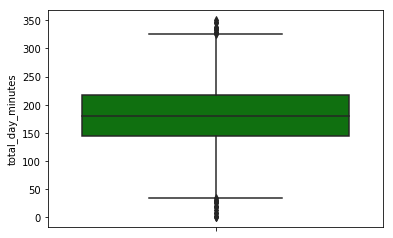

total_day_calls


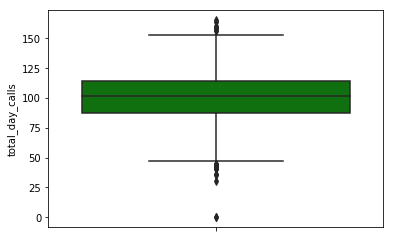

total_day_charge


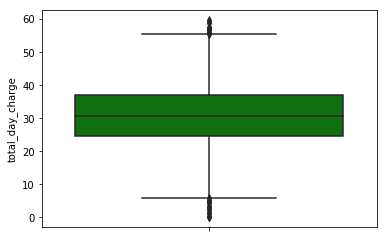

total_eve_minutes


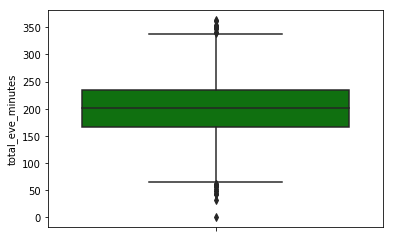

total_eve_calls


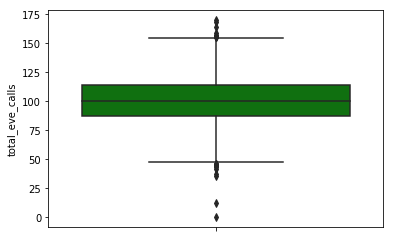

total_eve_charge


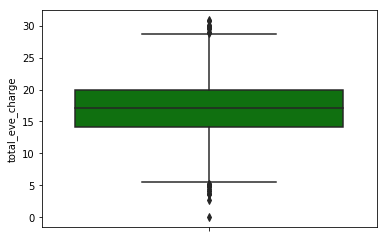

total_night_minutes


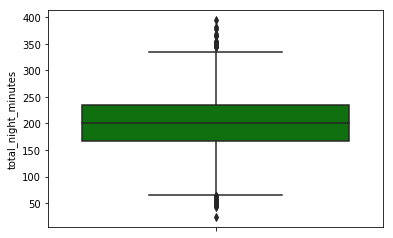

total_night_calls


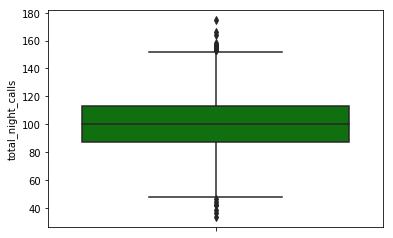

total_night_charge


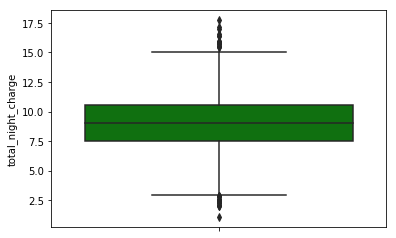

total_intl_minutes


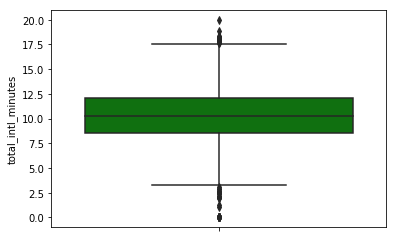

total_intl_calls


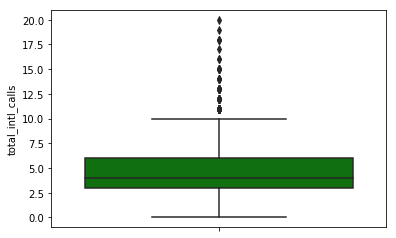

total_intl_charge


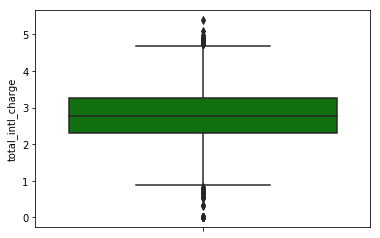

number_customer_service_calls


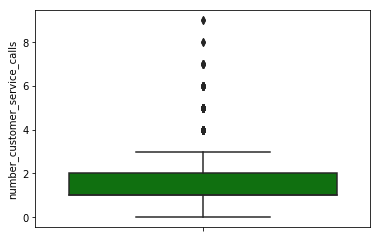

total_minutes


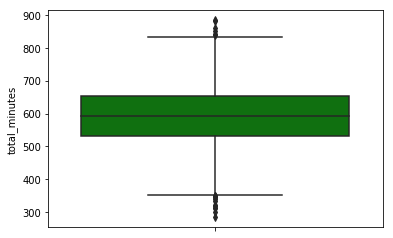

total_calls


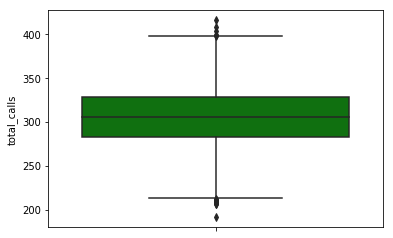

total_charge


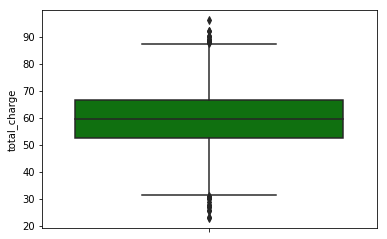

In [177]:
%matplotlib inline
for i in cnames:
    print (i)
    sns.boxplot(y = train_data[i] , data = train_data , color = 'g')
    plt.show()

**Inference : **
 - From the above box plot visualisation, we can understand that almost all the features in 'cnames' are symmetrically distributed except for the few which contains outliers because the upper fence and the lower fence are equidistant from the 75th percentile and 25th percentile respectively.

### 2.8.1.2 Box-Plot Visualisation of  Features based on label

total_day_minutes


/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:462: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


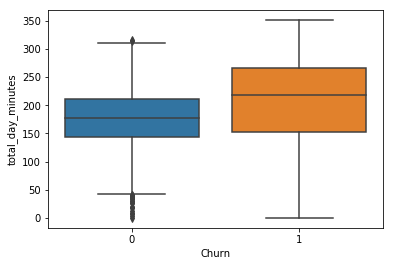

total_day_calls


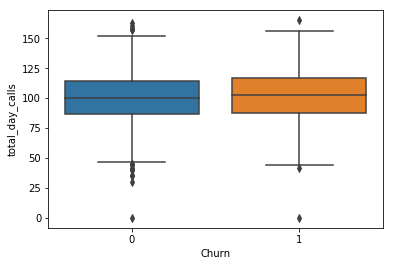

total_day_charge


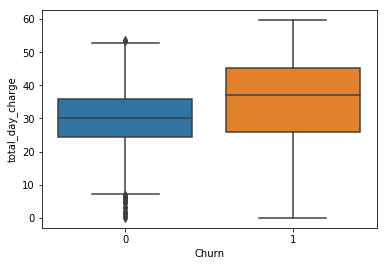

total_eve_minutes


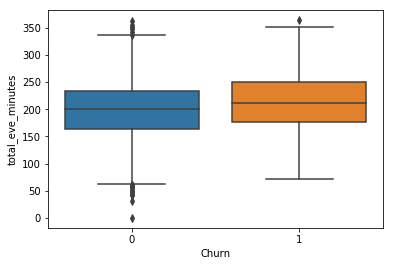

total_eve_calls


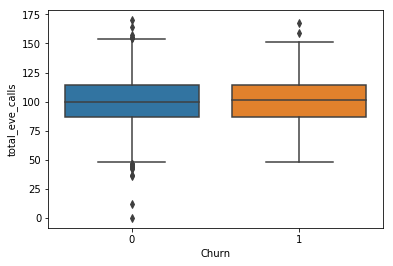

total_eve_charge


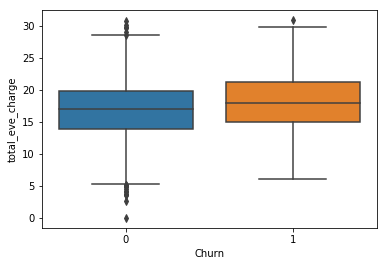

total_night_minutes


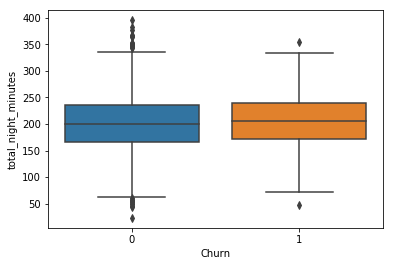

total_night_calls


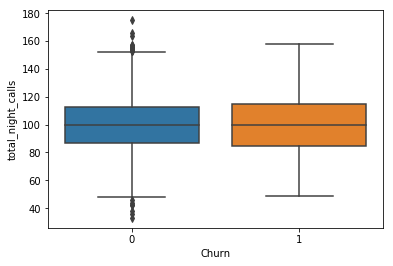

total_night_charge


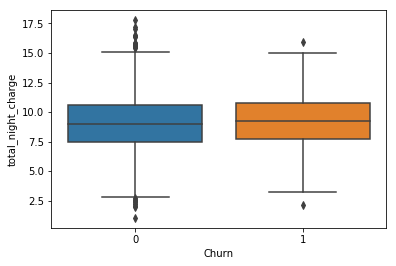

total_intl_minutes


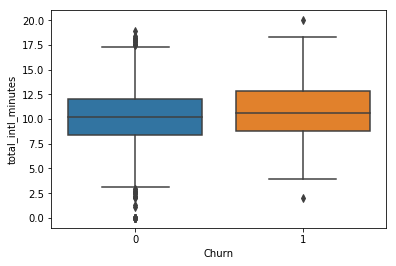

total_intl_calls


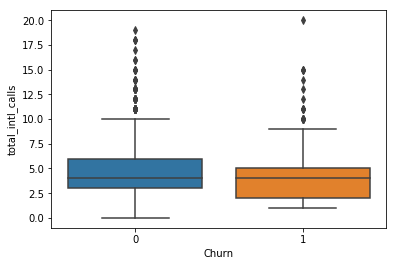

total_intl_charge


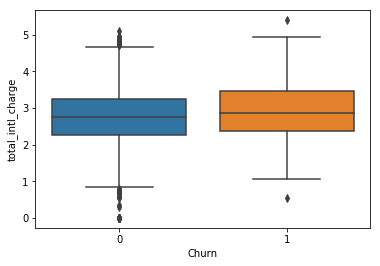

number_customer_service_calls


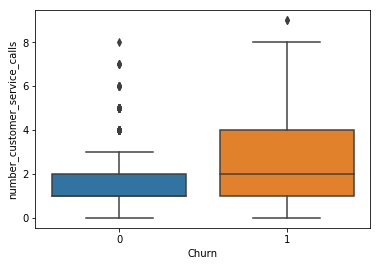

total_minutes


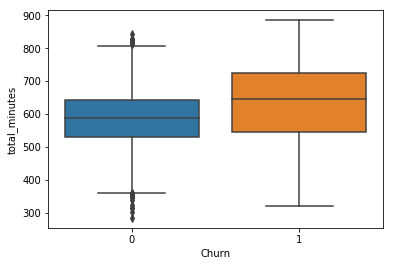

total_calls


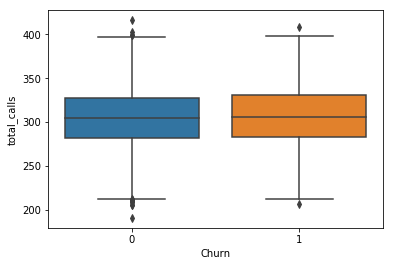

total_charge


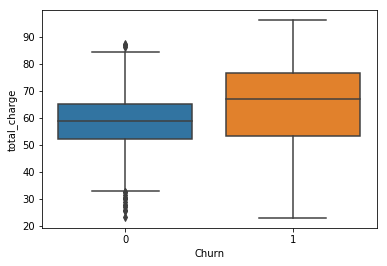

In [178]:
%matplotlib inline
for i in cnames:
    print (i)
    sns.boxplot(x = 'Churn' ,y = train_data[i] , data = train_data)
    plt.show()

**Inference** :
 - Box plot for almost every features based on the label '0' that indicates that the customer will not churn is symmetric. This means, the features might follow symmetric distribution.
 - Box plot for features like 'total_day_minutes' , 'total_day_charge' , 'number_customer_service_calls', 'total_minutes' ,'total_charge' do not look symmetric and might not follow symmetric distribution for positive label 1.
 - From the very first look at the box plot of 'number_customer_service calls' , it can be interpreted that the customer with label '1' (i.e Churn)made more number of customer service calls then the customers with label '0' ('Not Churn') and follow entirely different distributions. So, this variable might be a very good predictor of the target variable.


### 2.8.1.3 Violin Plot Visualisation of features

total_day_minutes


/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:598: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data)
/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:826: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data)


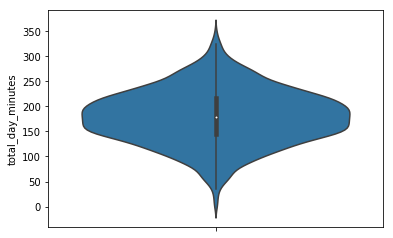

total_day_calls


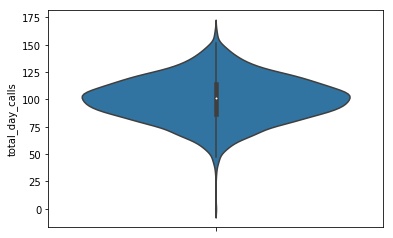

total_day_charge


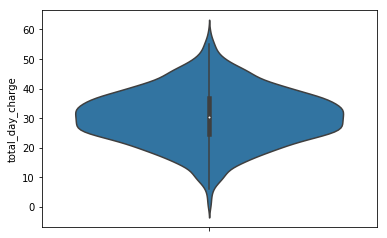

total_eve_minutes


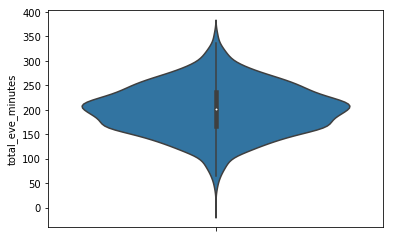

total_eve_calls


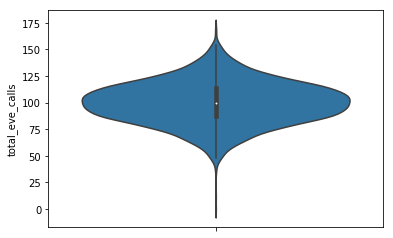

total_eve_charge


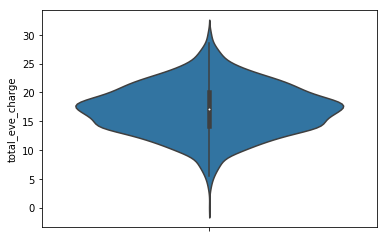

total_night_minutes


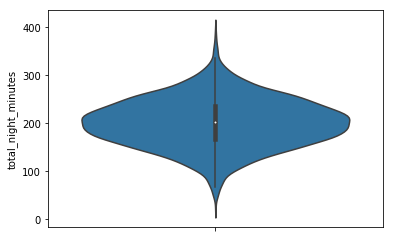

total_night_calls


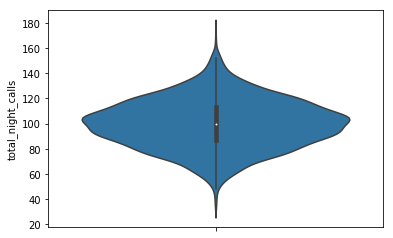

total_night_charge


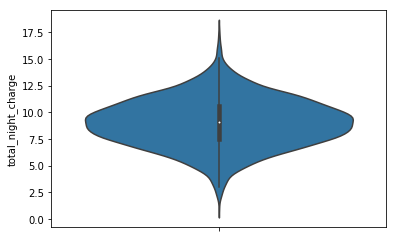

total_intl_minutes


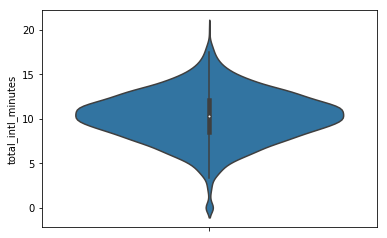

total_intl_calls


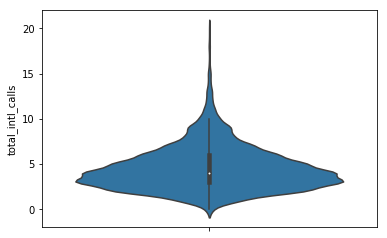

total_intl_charge


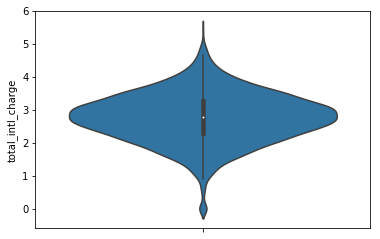

number_customer_service_calls


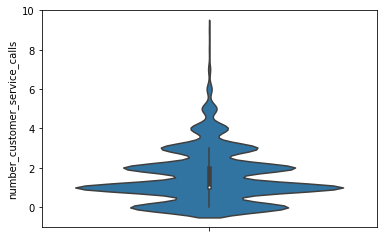

total_minutes


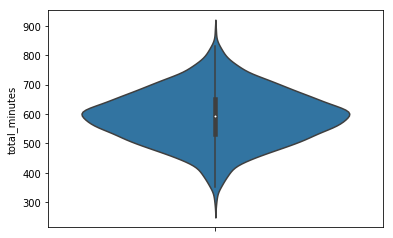

total_calls


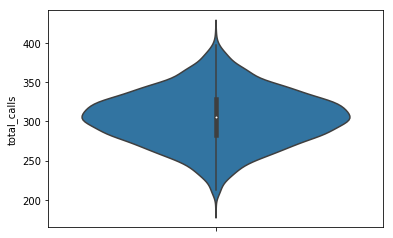

total_charge


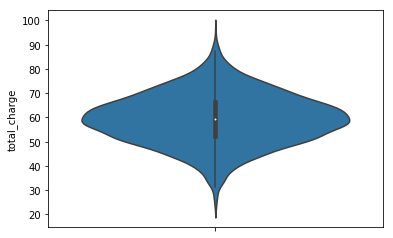

In [179]:
%matplotlib inline
for i in cnames:
    print (i)
    sns.violinplot(y = train_data[i] , data = train_data )
    plt.show()

**Inference :**
 - Violin Plots is one of the best ways to visualise data as it combines the power of both histogram,Probablity density function plots and Box plots.
 - Also, after plotting Violin plots , it can be inferred that most features like 'total_charge', 'total_calls', 'total_minutes','total_night_charge','total_night_minute' , 'total_day_calls' and 'total_day_minutes' seems to follow gaussian distribution.
 - So, we can use all the properties of central limit theorem for the features that follow gaussian distribution.

### 2.8.1.4 Violin Plot visualisation of features based on label

total_day_minutes


/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:598: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  kde_data = remove_na(group_data)
/Users/akash/anaconda3/lib/python3.6/site-packages/seaborn/categorical.py:826: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  violin_data = remove_na(group_data)


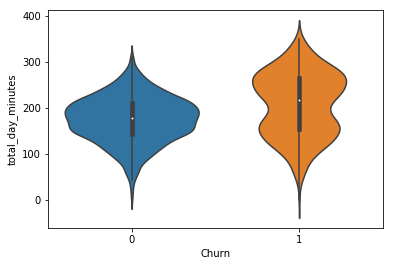

total_day_calls


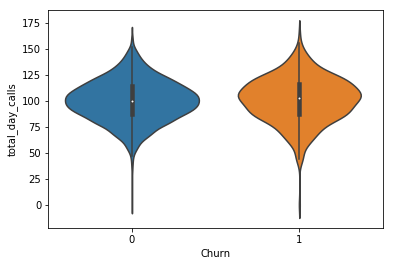

total_day_charge


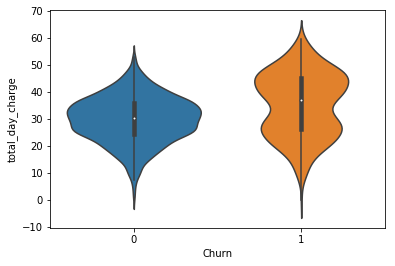

total_eve_minutes


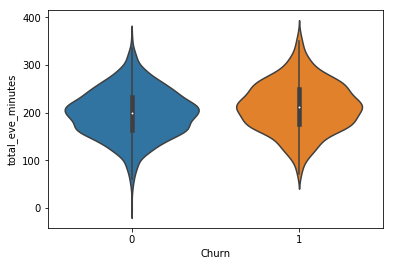

total_eve_calls


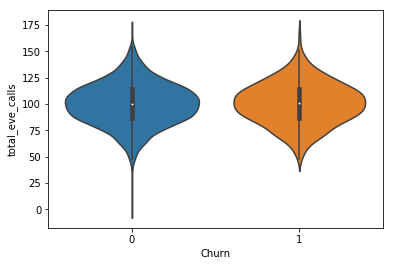

total_eve_charge


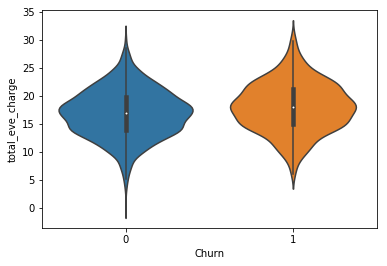

total_night_minutes


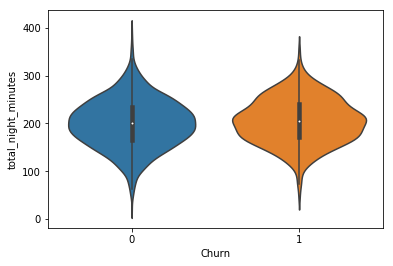

total_night_calls


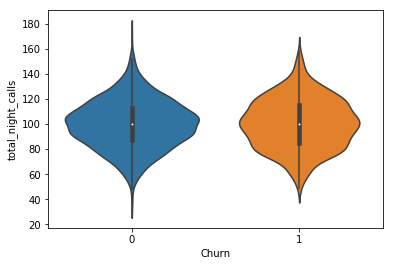

total_night_charge


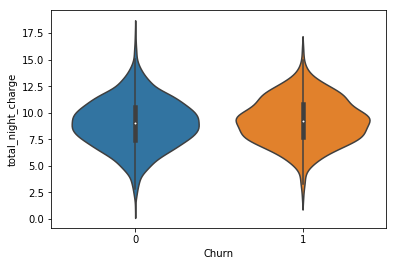

total_intl_minutes


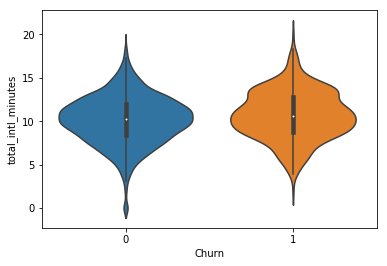

total_intl_calls


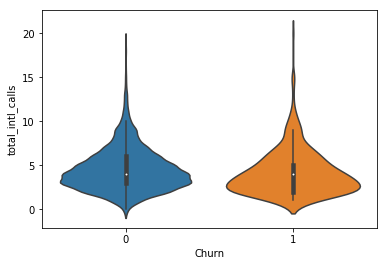

total_intl_charge


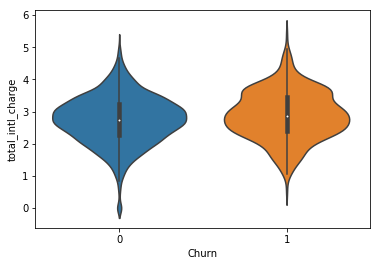

number_customer_service_calls


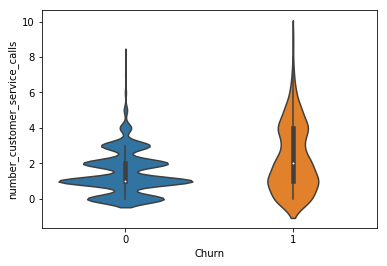

total_minutes


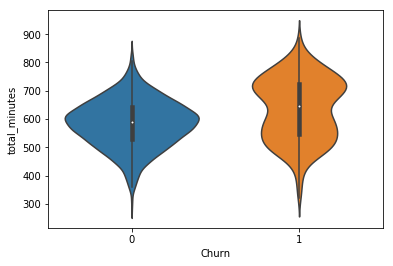

total_calls


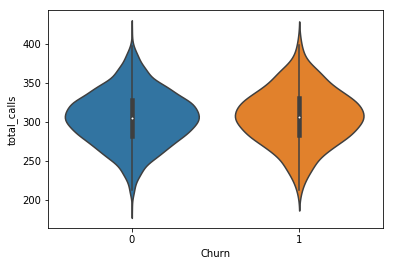

total_charge


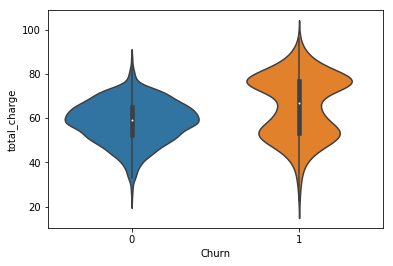

In [180]:
%matplotlib inline
for i in cnames:
    print (i)
    sns.violinplot(x = 'Churn' ,y = train_data[i] , data = train_data)
    plt.show()

** Inference : **
 - It is important to know the distribution of features among their class.
 - From violin plot of features based on the label. We can infer that features like 'total_calls' , 'total_intl_calls' , 'total_eve_calls' , 'total_eve_minutes' , 'total_eve_charge' , 'total_day_calls' follow similar distribution based on their labels.

## 2.8.2 Multivariate Analysis

### 2.8.2.1 Joint-Plot visualisation of features

/Users/akash/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


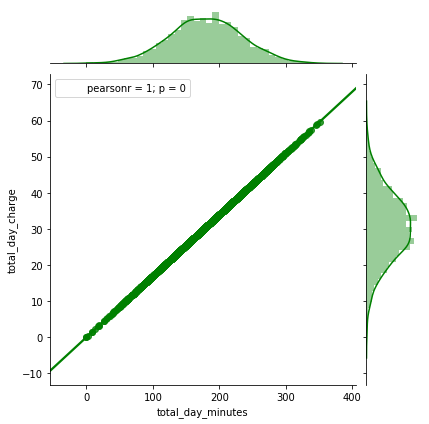

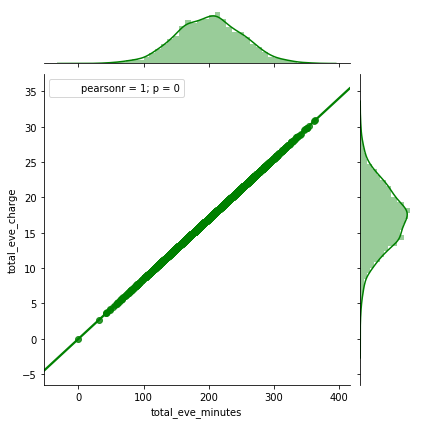

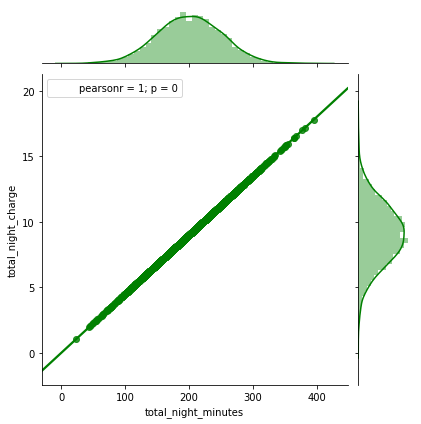

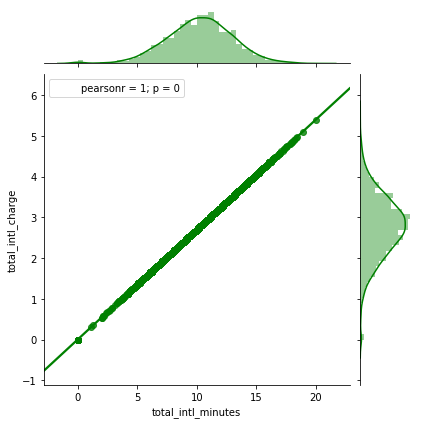

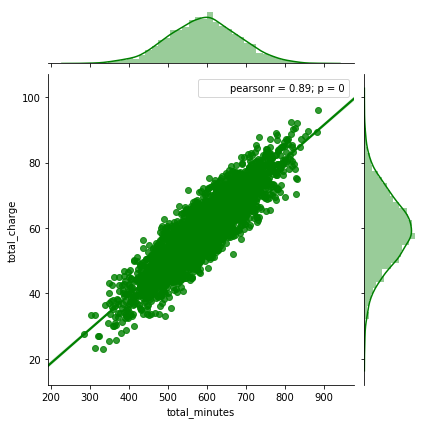

In [181]:
sns.jointplot(x= 'total_day_minutes' , y= 'total_day_charge', data= train_data  ,kind = 'reg' , color = 'g')
sns.jointplot(x= 'total_eve_minutes' , y= 'total_eve_charge', data= train_data , kind = 'reg', color = 'g')
sns.jointplot(x= 'total_night_minutes' , y= 'total_night_charge', data= train_data , kind = 'reg' , color = 'g')
sns.jointplot(x= 'total_intl_minutes' , y= 'total_intl_charge', data= train_data , kind = 'reg',color = 'g')
sns.jointplot(x= 'total_minutes' , y= 'total_charge', data= train_data , kind = 'reg',color = 'g')

**Inference : **
 - From the joint plot visualisation of features, it could be understood that features like 'total_day_charge' : 'total_day_minutes', 'total_eve_charge': total_eve_minutes , 'total_night_charge':total_night_minutes follow a linear relationship.
 - The joint-plot visualisation gives us an idea that these features may be correlated as they follow a linear relationship.
 - Features 'total_minutes':'total_charge' also follow linear relationship but not like other features mentioned above and the data points do not fall on the regression line and are linearly scattered along the regression line.

### 2.8.2.2 Pair-Plot Visualisation of data

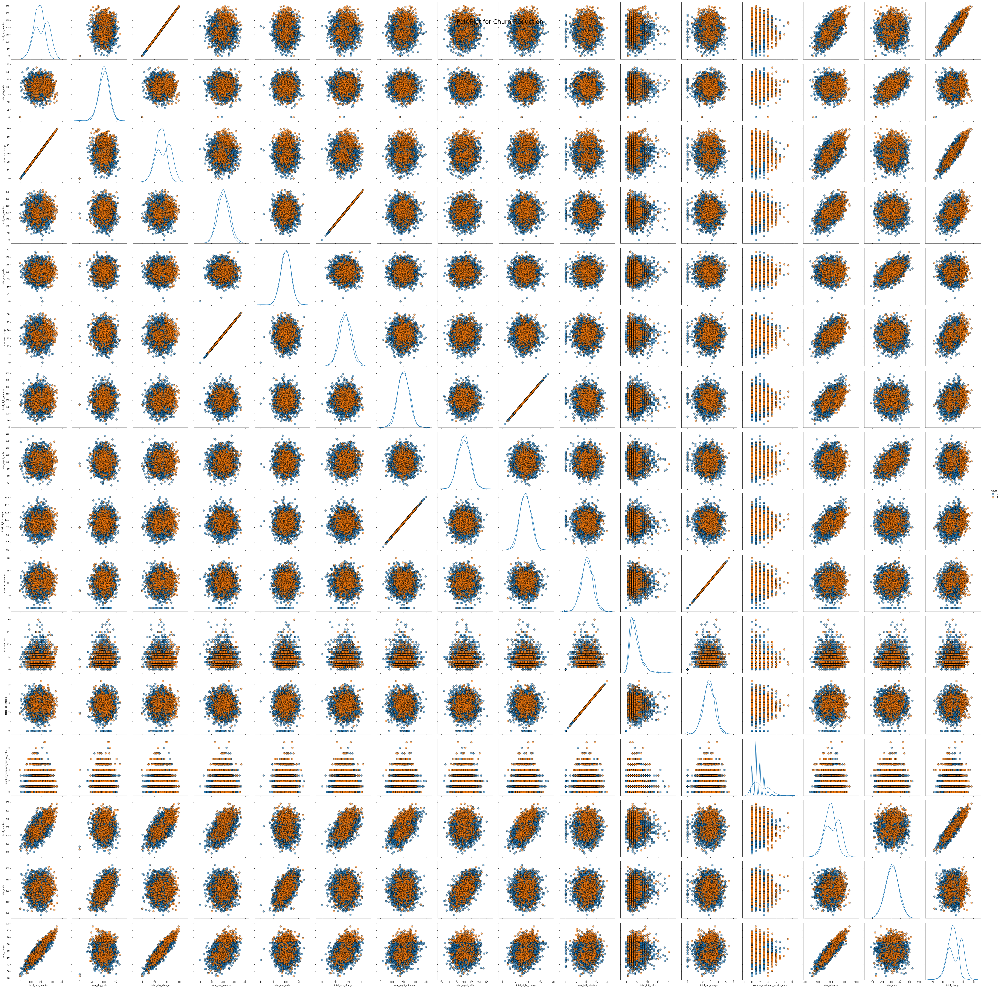

In [182]:
# Plot colored for 'churn'and 'not churn'
sns.pairplot(data = train_data, 
             vars = ['total_day_minutes',
        'total_day_calls', 'total_day_charge', 'total_eve_minutes',
        'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
        'total_night_calls', 'total_night_charge', 'total_intl_minutes',
        'total_intl_calls', 'total_intl_charge',
        'number_customer_service_calls', 'total_minutes', 'total_calls',
        'total_charge'], 
             hue = 'Churn', diag_kind = 'kde', 
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             size = 4);
# Title 
plt.suptitle('Pair Plot for Churn Reduction', 
             size = 28);

**Inference :** 
 - Although pair plots are not much of a great idea to visualise a high dimensional feature space but lets see if we can get something out of it.
 - The data points are randomly scattered in the feature space and it is hard to interpret the classes by drawing any regression line or any simple decision boundary.
 - Also, there is no extra information that can be extracted from the pair plots and was not extracted before from the other plots.

### 2.8.3 PCA Visualisation of train data

In [183]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
y_Pca = pca.fit_transform(X_train)

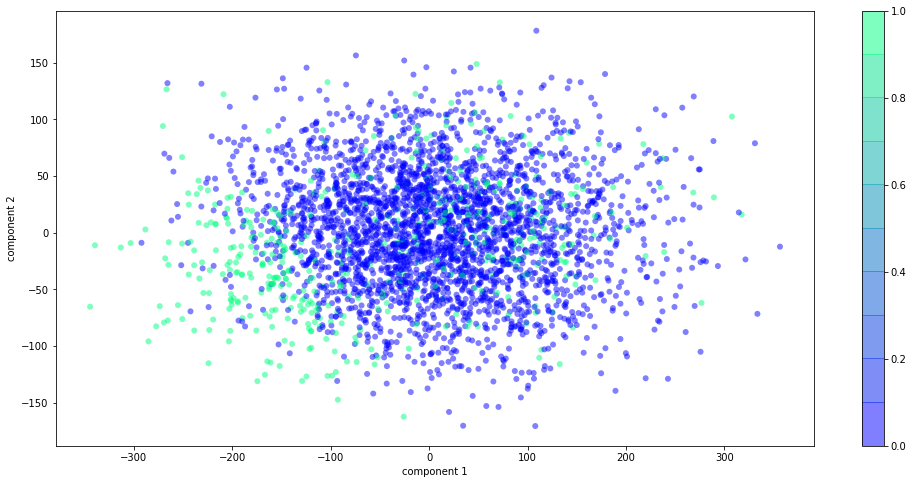

In [184]:
plt.scatter(y_Pca[:, 0], y_Pca[:, 1],
            c=y_train, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('winter', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.gcf().set_size_inches((17, 8)) 
plt.colorbar();


**Inference : **
 - In the above plot , 52.67% of the variance in the  data is explained by the  principal component 1 and 13.73% of the variance in the data is explained by the  principal component 2.
 - It is hard to interpret anything even after plotting PCA (Principal Component Analyssi) visualisation of the features along two components except the fact that the positive labels are spread more widely then the negative label.
 - Also that the negative labels are more dense then the positive label but it is obvious given the fact that our data is imbalanced and it contains more negative labels then the positive ones.

### 2.8.4 t-SNE Visualising the train data 

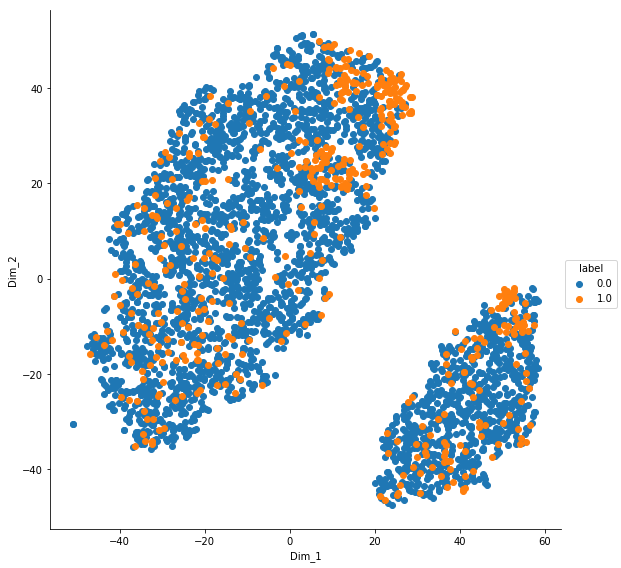

In [185]:
#TSNE Visualisation
from sklearn.manifold import TSNE

model = TSNE(n_components=2 , random_state= 0,perplexity= 60 , n_iter = 2000 )
tsne_data = model.fit_transform(X_train)

# creating a new data frame which help us in ploting the result data
tsne_data = np.vstack((tsne_data.T, y_train)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

# Ploting the result of tsne
sns.FacetGrid(tsne_df, hue="label", size=8).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.show()

**Inference :**
 - t-SNE is one of the best and state-of-the-art technnique for dimensionality reduction and is  a way to to reduce high dimensional features into lower dimensions, while trying to preserve the characteristics of the data.
 - The above t-sne plot forms two clusters of evenly scattered points among the two clusters.
 - But again, it is hard to interpret anything from the tsne plot as both the positive and negative label points are evenly distributed among the clusters

# 3. Data preparation and Data Cleaning

## 3.1 Handling Data Imbalance

In [ ]:
'''
from sklearn.utils import resample
train_data_majority = train_data[train_data.Churn == 0]
train_data_minority = train_data[train_data.Churn == 1]
train_data_majority.shape , train_data_minority.shape
'''

In [ ]:
'''
train_data_minority_upsampled = resample(train_data_minority, replace=True, n_samples=2493,random_state=123) 
train_data_upsampled = pd.concat([train_data_majority, train_data_minority_upsampled])
train_data_upsampled.shape
'''

** Inference :** <br>

Commenting out the code because, upsampling is not helping the models to increase their performance. In fact, When we feed upsmapled data to the machine learning models, the performance metric decreases.

## 3.2 Outliers Removal

In [ ]:
'''
cnames1 = ['account_length', 'area_code', 'number_vmail_messages',
       'total_day_minutes', 'total_day_calls', 'total_day_charge',
       'total_eve_minutes', 'total_eve_calls', 'total_eve_charge',
       'total_night_minutes', 'total_night_calls', 'total_night_charge',
       'total_intl_minutes', 'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls']

for i in cnames1:
    print (i)
    
    q75,q25 = np.percentile(train_data.loc[:,i], [75,25])  #calculating 75th and 25th percentile
    iqr = q75 - q25                                        #calculating 'Interquartile Range' which helps to calculate upper and lower fence
    
    lower_fence = q25 - (iqr * 1.5)
    upper_fence = q75 + (iqr * 1.5)
    
    print (lower_fence)
    print (upper_fence)
    
    train_data = train_data.drop(train_data[train_data.loc[:,i] < lower_fence].index)  #Drop thosse observations whose values are less then the lower fence
    train_data = train_data.drop(train_data[train_data.loc[:,i] > upper_fence].index)  #Drop thosse observations whose values are greater then the upper fence
'''

**Inference:** <br>

commenting the code because,Removing the outliers from the data causes below probelms :
 - Decreases the data point in the train data by atleast 14% and we cannot afford to loose more data as we already have less data.
 - Removing the outliers from the data is not helping the machine learning models to perform better. In fact performance decreases after we feed outliers removed data to the models.
 - Also, we dont have any extreme outliers with the potential to effect our machine learning models.So, we use algorithms which are not sensitive to outliers.

## 3.3 Scaling the data

In [189]:
scaler = StandardScaler() # create an object
X_train_data_scaled = scaler.fit_transform(X_train) # fit the scaler to the train set, and then transform it
X_test_data_scaled = scaler.fit_transform(X_test) # fit the scaler to the test set, and then transform it

In [190]:
X_train_data_scaled.shape , X_test_data_scaled.shape

((3333, 20), (1667, 20))

In [191]:
X_train_data_scaled = pd.DataFrame(X_train_data_scaled , columns = X_train.columns)
X_test_data_scaled = pd.DataFrame(X_test_data_scaled , columns = X_test.columns)

In [192]:
X_train_data_scaled.head(3)

,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,total_minutes,total_calls,total_charge,international_plan_ yes,voice_mail_plan_ yes
0,-0.523603,1.234883,1.566767,0.476643,1.567036,-0.070610,-0.055940,-0.070427,0.866743,-0.465494,0.866029,-0.085008,-0.601195,-0.085690,-0.427932,1.393531,-0.062048,1.534209,-0.32758,1.617086
1,-0.523603,1.307948,-0.333738,1.124503,-0.334013,-0.108080,0.144867,-0.107549,1.058571,0.147825,1.059390,1.240482,-0.601195,1.241169,-0.427932,0.370635,0.779923,-0.019975,-0.32758,1.617086
2,-0.523603,-0.591760,1.168304,0.675985,1.168464,-1.573383,0.496279,-1.573900,-0.756869,0.198935,-0.755571,0.703121,0.211534,0.697156,-1.188218,-0.583326,0.808957,0.270482,-0.32758,-0.618396


## 3.4 Feature Selection

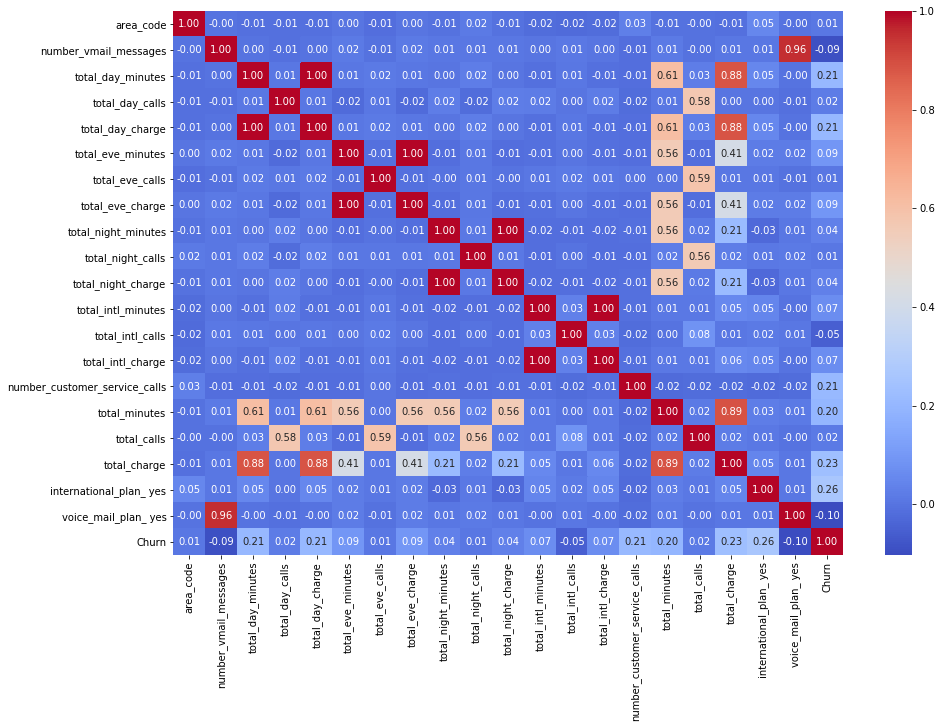

In [193]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(train_data.corr(),annot=True, fmt = ".2f", cmap = "coolwarm")

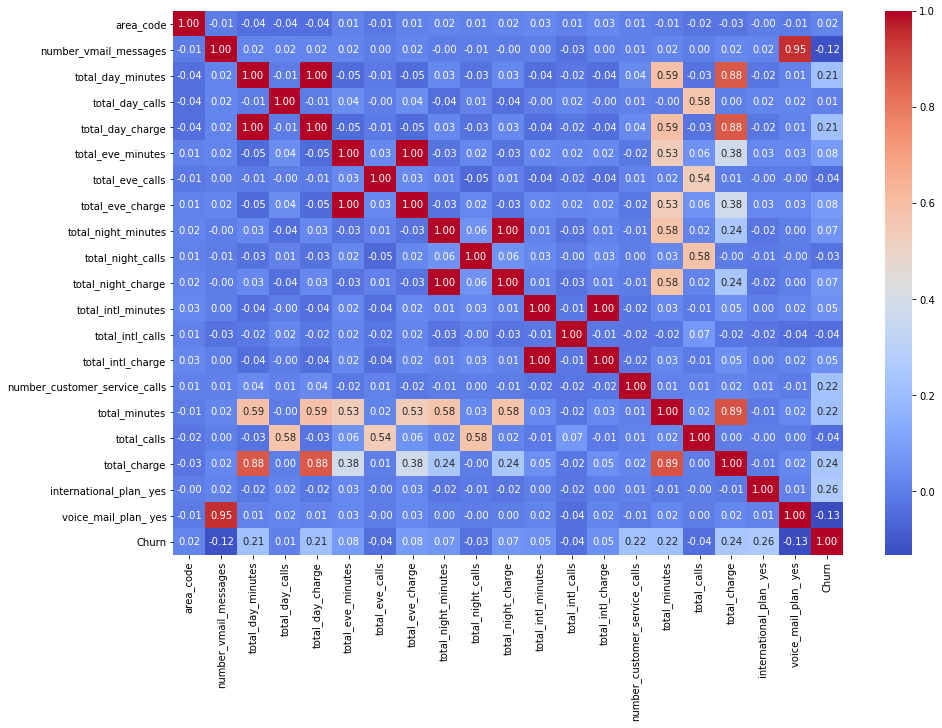

In [194]:
fig, ax = plt.subplots(figsize=(15,10))
sns.heatmap(test_data.corr(),annot=True, fmt = ".2f", cmap = "coolwarm")

**Inference :**
The plots are correlation plots which gives correlation between the features which helps us to reduce the feature space. From the above plots, we can observe the features that are correlated to one other.
 - total_day_charge and total_day_minutes are correlated to each other.
 - total_eve_charge and total_eve_minutes are correlated to each other.
 - total_night_charge and total_night_minutes are correlated to each other.
 - total_int_charge and total_int_minutes are correlated to each other.
 - total_charge and total_minutes are correlated to each other.
 - voice_mail_plan_yes and number_vmail_messages are correlated to each other.

So, we need to remove either of the features among the above six pairs

In [195]:
# Creating a function to remove the correlated features.
# find and remove correlated features
# in order to reduce the feature space a bit
# so that the algorithm takes shorter

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

corr_features = correlation(X_train_data_scaled, 0.8)
print('correlated features: ', len(set(corr_features)) )

correlated features:  6


In [196]:
X_train_data_scaled.drop(labels=corr_features, axis=1, inplace=True)
X_test_data_scaled.drop(labels=corr_features, axis=1, inplace=True)

In [197]:
print(X_train_data_scaled.shape)
print(X_test_data_scaled.shape)

(3333, 14)
(1667, 14)


In [198]:
X_train_data_scaled.head(3)

,area_code,number_vmail_messages,total_day_minutes,total_day_calls,total_eve_minutes,total_eve_calls,total_night_minutes,total_night_calls,total_intl_minutes,total_intl_calls,number_customer_service_calls,total_minutes,total_calls,international_plan_ yes
0,-0.523603,1.234883,1.566767,0.476643,-0.070610,-0.055940,0.866743,-0.465494,-0.085008,-0.601195,-0.427932,1.393531,-0.062048,-0.32758
1,-0.523603,1.307948,-0.333738,1.124503,-0.108080,0.144867,1.058571,0.147825,1.240482,-0.601195,-0.427932,0.370635,0.779923,-0.32758
2,-0.523603,-0.591760,1.168304,0.675985,-1.573383,0.496279,-0.756869,0.198935,0.703121,0.211534,-1.188218,-0.583326,0.808957,-0.32758


# 4.1 Machine Learning Models

## 4.1 Naive Bayes

In [199]:
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.naive_bayes import GaussianNB
NB_model = GaussianNB().fit(X_train_data_scaled , y_train)
NB_predictions_train = NB_model.predict(X_train_data_scaled)
NB_predictions = NB_model.predict(X_test_data_scaled)

In [200]:
print('Train Data')
precision, recall, fscore, support = score(y_train, NB_predictions_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((NB_predictions_train==y_train).sum() / len(NB_predictions_train), 3)))

print("Test Data")
precision, recall, fscore, support = score(y_test, NB_predictions, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((NB_predictions==y_test).sum() / len(NB_predictions), 3)))

Train Data
Precision: 0.503 / Recall: 0.476 /fscore : 0.489 /Accuracy: 0.856
Test Data
Precision: 0.493 / Recall: 0.473 /fscore : 0.483 /Accuracy: 0.864


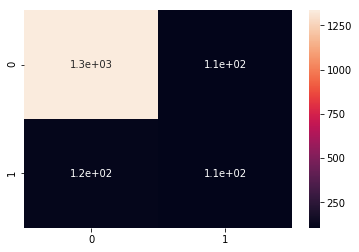

In [201]:
sns.heatmap(confusion_matrix(y_test, NB_predictions, labels=None, sample_weight=None), annot=True)

#### 3.1.1 Probablity Score for the classes

In [202]:
clf = GaussianNB()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [203]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.916247,0.083753
1,0.931891,0.068109
2,0.598720,0.401280


##### Example DataPoint for Correctly Classified Point

In [204]:
test_point_index =1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled[:test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled[:test_point_index]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9162 0.0838]]
Actual Class : 0


##### Example DataPoint for Incorrectly Classified Point

In [205]:
test_point_index = 50
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.3541 0.6459]]
Actual Class : 0


## 4.2 KNN

**Hyperparameter Tuning**

In [281]:
def train_KNN(n_neigh):
    knn = KNeighborsClassifier(n_neighbors= n_neigh)
    knn_model = knn.fit(X_train_data_scaled, y_train)
    y_pred = knn_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('n_neighbours : {}  ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        n_neigh, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [282]:
for n_neigh in [3,5,7,10,15,20,25,30]:
    train_KNN(n_neigh)

n_neighbours : 3  ---- Precision: None / Recall: 0.703 / Accuracy: 0.433
n_neighbours : 5  ---- Precision: None / Recall: 0.761 / Accuracy: 0.384
n_neighbours : 7  ---- Precision: None / Recall: 0.755 / Accuracy: 0.344
n_neighbours : 10  ---- Precision: None / Recall: 0.923 / Accuracy: 0.214
n_neighbours : 15  ---- Precision: None / Recall: 0.934 / Accuracy: 0.254
n_neighbours : 20  ---- Precision: None / Recall: 0.913 / Accuracy: 0.188
n_neighbours : 25  ---- Precision: None / Recall: 0.84 / Accuracy: 0.188
n_neighbours : 30  ---- Precision: None / Recall: 0.906 / Accuracy: 0.129


**Testing the model with best hyperparameters**

In [289]:
from sklearn.neighbors import KNeighborsClassifier
KNN_model = KNeighborsClassifier(n_neighbors= 3).fit(X_train_data_scaled , y_train)
KNN_pred_train = KNN_model.predict(X_train_data_scaled)
KNN_pred= KNN_model.predict(X_test_data_scaled)

In [290]:
print('Train Data')
precision, recall, fscore, support = score(y_train, KNN_pred_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((KNN_pred_train==y_train).sum() / len(KNN_pred_train), 3)))

print('Test Data')
precision, recall, fscore, support = score(y_test, KNN_pred, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((KNN_pred==y_test).sum() / len(KNN_pred), 3)))

Train Data
Precision: 0.93 / Recall: 0.656 /fscore : 0.769 /Accuracy: 0.943
Test Data
Precision: 0.703 / Recall: 0.433 /fscore : 0.536 /Accuracy: 0.899


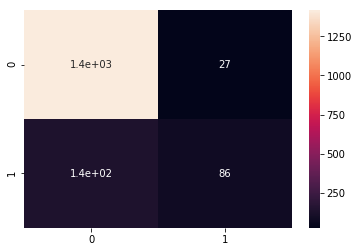

In [208]:
sns.heatmap(confusion_matrix(y_test, KNN_pred, labels=None, sample_weight=None), annot=True)

#### 3.2.1 Probablity Score for the classes

In [209]:
clf = KNeighborsClassifier()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [210]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.876706,0.123294
1,0.950729,0.049271
2,0.876706,0.123294


##### Example Datapoint for correctly classified point

In [211]:
test_point_index =1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled[:test_point_index])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled[:test_point_index]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.8767 0.1233]]
Actual Class : 0


##### Example Datapoint for incorrectly classified point

In [212]:
test_point_index = 79
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.3863 0.6137]]
Actual Class : 0


## 4.3 Logistic Regression

### 3.3.1 With Class Balancing

**Hyperparameter Tuning**

In [318]:
def logistic(C):
    logs = LogisticRegression(class_weight='balanced',C= C)
    logst_model = logs.fit(X_train_data_scaled, y_train)
    y_pred = logst_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('C : {}  ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        C, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [319]:
for C in [0.001, 0.01, 0.1, 1, 10, 100, 1000]:
    logistic(C)

C : 0.001  ---- Precision: None / Recall: 0.306 / Accuracy: 0.862
C : 0.01  ---- Precision: None / Recall: 0.348 / Accuracy: 0.835
C : 0.1  ---- Precision: None / Recall: 0.352 / Accuracy: 0.817
C : 1  ---- Precision: None / Recall: 0.356 / Accuracy: 0.817
C : 10  ---- Precision: None / Recall: 0.356 / Accuracy: 0.817
C : 100  ---- Precision: None / Recall: 0.356 / Accuracy: 0.817
C : 1000  ---- Precision: None / Recall: 0.356 / Accuracy: 0.817


**Testing the model with best hyperparamters**

In [320]:
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression(class_weight='balanced', C = 1).fit(X_train_data_scaled , y_train)
logiticRegr_predict_train = logisticRegr.predict(X_train_data_scaled)
logiticRegr_predict = logisticRegr.predict(X_test_data_scaled)

In [321]:
print('Train Data')
precision, recall, fscore, support = score(y_train, logiticRegr_predict_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((logiticRegr_predict_train==y_train).sum() / len(logiticRegr_predict_train), 3)))



print('Test Data')
precision, recall, fscore, support = score(y_test, logiticRegr_predict, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((logiticRegr_predict==y_test).sum() / len(logiticRegr_predict), 3)))

Train Data
Precision: 0.361 / Recall: 0.758 /fscore : 0.489 /Accuracy: 0.771
Test Data
Precision: 0.356 / Recall: 0.817 /fscore : 0.496 /Accuracy: 0.777


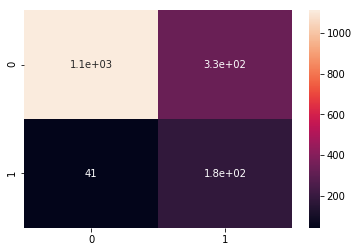

In [322]:
sns.heatmap(confusion_matrix(y_test, logiticRegr_predict, labels=None, sample_weight=None), annot=True)

#### 3.3.1.1 Probablity Score for the classes


In [323]:
clf = LogisticRegression(class_weight='balanced')
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [324]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.924517,0.075483
1,0.946477,0.053523
2,0.773032,0.226968


##### Example datapoint for correctly classified point

In [325]:
test_point_index = 1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9465 0.0535]]
Actual Class : 0


##### Example datapoint for Incorrectly classified point

In [326]:
test_point_index = 79
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.4179 0.5821]]
Actual Class : 0


### 3.3.2 Without Class Balancing

In [328]:
def logistic(C):
    logs = LogisticRegression(C= C)
    logst_model = logs.fit(X_train_data_scaled, y_train)
    y_pred = logst_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('C : {}  ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        C, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [329]:
for C in [0.001, 0.01, 0.1, 1, 10, 100, 1000]:
    logistic(C)

C : 0.001  ---- Precision: None / Recall: 0.654 / Accuracy: 0.152
C : 0.01  ---- Precision: None / Recall: 0.597 / Accuracy: 0.165
C : 0.1  ---- Precision: None / Recall: 0.569 / Accuracy: 0.183
C : 1  ---- Precision: None / Recall: 0.566 / Accuracy: 0.192
C : 10  ---- Precision: None / Recall: 0.558 / Accuracy: 0.192
C : 100  ---- Precision: None / Recall: 0.558 / Accuracy: 0.192
C : 1000  ---- Precision: None / Recall: 0.558 / Accuracy: 0.192


In [330]:
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression(C = 1).fit(X_train_data_scaled , y_train)
logiticRegr_predict_train =logisticRegr.predict(X_train_data_scaled)
logiticRegr_predict = logisticRegr.predict(X_test_data_scaled)

In [331]:
print('Train Data')
precision, recall, fscore, support = score(y_train, logiticRegr_predict_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((logiticRegr_predict_train==y_train).sum() / len(logiticRegr_predict_train), 3)))



print('Test Data')
precision, recall, fscore, support = score(y_test, logiticRegr_predict, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((logiticRegr_predict==y_test).sum() / len(logiticRegr_predict), 3)))

Train Data
Precision: 0.574 / Recall: 0.217 /fscore : 0.315 /Accuracy: 0.863
Test Data
Precision: 0.566 / Recall: 0.192 /fscore : 0.287 /Accuracy: 0.872


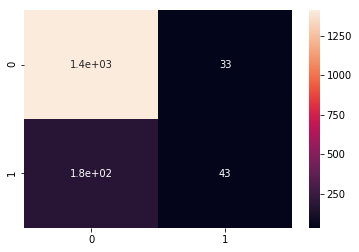

In [332]:
sns.heatmap(confusion_matrix(y_test, logiticRegr_predict, labels=None, sample_weight=None), annot=True)

#### 3.3.2.1 Probablity Score for the classes


In [333]:
clf = LogisticRegression()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [334]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.930458,0.069542
1,0.948201,0.051799
2,0.751730,0.248270


##### Example datapoint for correctly classified point

In [335]:
test_point_index = 1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9482 0.0518]]
Actual Class : 0


##### Example datapoint for Incorrectly classified point

In [336]:
test_point_index = 79
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.4438 0.5562]]
Actual Class : 0


## 4.4 Decision Trees

**Hyperparameter Tuning**

In [342]:
from sklearn import tree
def DT(depth):
    dt = tree.DecisionTreeClassifier(criterion = 'entropy', max_depth = depth)
    dt_model = dt.fit(X_train_data_scaled, y_train)
    y_pred = dt_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('max_depth : {}  ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        depth, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [343]:
for depth in [10, 20, 30, None]:
    DT(depth)

max_depth : 10  ---- Precision: 0.893 / Recall: 0.786 / Accuracy: 0.959
max_depth : 20  ---- Precision: 0.79 / Recall: 0.79 / Accuracy: 0.944
max_depth : 30  ---- Precision: 0.805 / Recall: 0.795 / Accuracy: 0.947
max_depth : None  ---- Precision: 0.799 / Recall: 0.799 / Accuracy: 0.946


**Testing the model with best hyperparameters**

In [350]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(criterion = 'entropy' , max_depth = 10).fit(X_train_data_scaled , y_train)
clf_pred_train = clf.predict(X_train_data_scaled)
clf_pred = clf.predict(X_test_data_scaled)

In [351]:
print('Train Data')
precision, recall, fscore, support = score(y_train, clf_pred_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((clf_pred_train==y_train).sum() / len(clf_pred_train), 3)))



print('Test Data')
precision, recall, fscore, support = score(y_test, clf_pred, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((clf_pred==y_test).sum() / len(clf_pred), 3)))

Train Data
Precision: 0.998 / Recall: 0.88 /fscore : 0.935 /Accuracy: 0.982
Test Data
Precision: 0.88 / Recall: 0.786 /fscore : 0.83 /Accuracy: 0.957


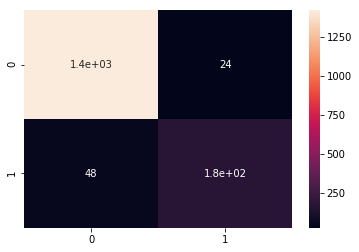

In [352]:
sns.heatmap(confusion_matrix(y_test, clf_pred, labels=None, sample_weight=None), annot=True)

#### 3.4.1 Probablity Score for the classes

In [461]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [462]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.955737,0.044263
1,0.955737,0.044263
2,0.731204,0.268796


##### Example datapoint for correctly classified point

In [463]:
test_point_index = 1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9557 0.0443]]
Actual Class : 0


##### Example datapoint for Incorrectly classified point

In [464]:
test_point_index = 198
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.4933 0.5067]]
Actual Class : 0


## 4.5 Random Forest

**Hyperparameter Tuning**

In [363]:
def train_RF(n_est, depth):
    rf = RandomForestClassifier(n_estimators=n_est, max_depth=depth, n_jobs=-1, criterion = 'entropy')
    rf_model = rf.fit(X_train_data_scaled, y_train)
    y_pred = rf_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('Est: {} / Depth: {} ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        n_est, depth, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [364]:
for n_est in [10, 50, 100,500,600]:
    for depth in [10, 20, 30, None]:
        train_RF(n_est, depth)

Est: 10 / Depth: 10 ---- Precision: 0.918 / Recall: 0.696 / Accuracy: 0.951
Est: 10 / Depth: 20 ---- Precision: 0.923 / Recall: 0.696 / Accuracy: 0.951
Est: 10 / Depth: 30 ---- Precision: 0.944 / Recall: 0.679 / Accuracy: 0.951
Est: 10 / Depth: None ---- Precision: 0.919 / Recall: 0.661 / Accuracy: 0.947
Est: 50 / Depth: 10 ---- Precision: 0.959 / Recall: 0.737 / Accuracy: 0.96
Est: 50 / Depth: 20 ---- Precision: 0.955 / Recall: 0.75 / Accuracy: 0.962
Est: 50 / Depth: 30 ---- Precision: 0.955 / Recall: 0.759 / Accuracy: 0.963
Est: 50 / Depth: None ---- Precision: 0.953 / Recall: 0.719 / Accuracy: 0.957
Est: 100 / Depth: 10 ---- Precision: 0.977 / Recall: 0.75 / Accuracy: 0.964
Est: 100 / Depth: 20 ---- Precision: 0.956 / Recall: 0.772 / Accuracy: 0.965
Est: 100 / Depth: 30 ---- Precision: 0.971 / Recall: 0.759 / Accuracy: 0.965
Est: 100 / Depth: None ---- Precision: 0.96 / Recall: 0.746 / Accuracy: 0.962
Est: 500 / Depth: 10 ---- Precision: 0.96 / Recall: 0.746 / Accuracy: 0.962
Est: 5

#### Testing the model with best hyperparameters

In [365]:
RF_model = RandomForestClassifier(n_estimators=600 , max_depth = 30,criterion = 'entropy').fit(X_train_data_scaled , y_train)
RF_predictions_train = RF_model.predict(X_train_data_scaled)
RF_predictions = RF_model.predict(X_test_data_scaled)

In [366]:
print('Train Data')
precision, recall, fscore, support = score(y_train, RF_predictions_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((RF_predictions_train==y_train).sum() / len(RF_predictions_train), 3)))



print('Test Data')
precision, recall, fscore, support = score(y_test, RF_predictions, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((RF_predictions==y_test).sum() / len(RF_predictions), 3)))

Train Data
Precision: 1.0 / Recall: 1.0 /fscore : 1.0 /Accuracy: 1.0
Test Data
Precision: 0.956 / Recall: 0.777 /fscore : 0.857 /Accuracy: 0.965


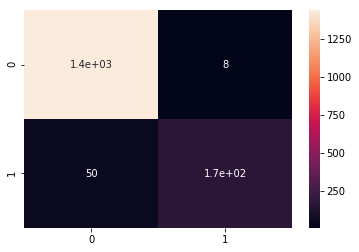

In [367]:
sns.heatmap(confusion_matrix(y_test, RF_predictions, labels=None, sample_weight=None), annot=True)

#### 3.5.1 Probablity Score for the classes

In [368]:
clf = tree.DecisionTreeClassifier()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [369]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.954057,0.045943
1,0.954057,0.045943
2,0.954057,0.045943


##### Example Datapoint for correctly classified point

In [370]:
test_point_index = 1
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9541 0.0459]]
Actual Class : 0


##### Example Datapoint for incorrectly classified point

In [455]:
test_point_index = 198
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.4975 0.5025]]
Actual Class : 0


## 4.6 XGBoost

In [384]:
from xgboost import XGBClassifier
def XG(min_child_weight,gamma,subsample,colsample_bytree,max_depth):
    xg = XGBClassifier(criterion = 'entropy', min_child_weight = min_child_weight,gamma =gamma,\
                       subsample =subsample,colsample_bytree = colsample_bytree,max_depth = max_depth)
    xg_model = xg.fit(X_train_data_scaled, y_train)
    y_pred = xg_model.predict(X_test_data_scaled)
    precision, recall, fscore, support = score(y_test, y_pred, pos_label= 1, average='binary')
    print('min_child_weight : {}, gamma : {},subsample : {},colsample_bytree : {},max_depth : {}  ---- Precision: {} / Recall: {} / Accuracy: {}'.format(
        min_child_weight,gamma,subsample,colsample_bytree,max_depth, round(precision, 3), round(recall, 3),
        round((y_pred==y_test).sum() / len(y_pred), 3)))

In [385]:
for min_child_weight in [1]:
    for gamma in [0.5 , 1]:
        for subsample in [0.6, 0.8]:
            for colsample_bytree in [0.8, 1]:
                for max_depth in [4,5]:
                    XG(min_child_weight, gamma, subsample,colsample_bytree, max_depth)

/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.6,colsample_bytree : 0.8,max_depth : 4  ---- Precision: 0.957 / Recall: 0.786 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.6,colsample_bytree : 0.8,max_depth : 5  ---- Precision: 0.962 / Recall: 0.786 / Accuracy: 0.967


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.6,colsample_bytree : 1,max_depth : 4  ---- Precision: 0.962 / Recall: 0.781 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.6,colsample_bytree : 1,max_depth : 5  ---- Precision: 0.952 / Recall: 0.804 / Accuracy: 0.968


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.8,colsample_bytree : 0.8,max_depth : 4  ---- Precision: 0.947 / Recall: 0.795 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.8,colsample_bytree : 0.8,max_depth : 5  ---- Precision: 0.962 / Recall: 0.799 / Accuracy: 0.969


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.8,colsample_bytree : 1,max_depth : 4  ---- Precision: 0.945 / Recall: 0.772 / Accuracy: 0.963


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 0.5,subsample : 0.8,colsample_bytree : 1,max_depth : 5  ---- Precision: 0.947 / Recall: 0.79 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.6,colsample_bytree : 0.8,max_depth : 4  ---- Precision: 0.957 / Recall: 0.79 / Accuracy: 0.967


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.6,colsample_bytree : 0.8,max_depth : 5  ---- Precision: 0.962 / Recall: 0.786 / Accuracy: 0.967


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.6,colsample_bytree : 1,max_depth : 4  ---- Precision: 0.962 / Recall: 0.781 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.6,colsample_bytree : 1,max_depth : 5  ---- Precision: 0.947 / Recall: 0.79 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.8,colsample_bytree : 0.8,max_depth : 4  ---- Precision: 0.942 / Recall: 0.799 / Accuracy: 0.966


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.8,colsample_bytree : 0.8,max_depth : 5  ---- Precision: 0.957 / Recall: 0.799 / Accuracy: 0.968


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


min_child_weight : 1, gamma : 1,subsample : 0.8,colsample_bytree : 1,max_depth : 4  ---- Precision: 0.946 / Recall: 0.777 / Accuracy: 0.964
min_child_weight : 1, gamma : 1,subsample : 0.8,colsample_bytree : 1,max_depth : 5  ---- Precision: 0.927 / Recall: 0.79 / Accuracy: 0.963


/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [386]:
from xgboost import XGBClassifier
model = XGBClassifier(criterion = 'entropy', min_child_weight = 1,gamma =0.5,\
                       subsample =0.6,colsample_bytree = 1,max_depth = 5)
model.fit(X_train_data_scaled , y_train)
model_predict_train = model.predict(X_train_data_scaled)
model_predict = model.predict(X_test_data_scaled)

/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [387]:
print('Train Data')
precision, recall, fscore, support = score(y_train, model_predict_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((model_predict_train==y_train).sum() / len(model_predict_train), 3)))

print('Test Data')
precision, recall, fscore, support = score(y_test, model_predict, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((model_predict==y_test).sum() / len(model_predict), 3)))

Train Data
Precision: 1.0 / Recall: 0.874 /fscore : 0.933 /Accuracy: 0.982
Test Data
Precision: 0.952 / Recall: 0.804 /fscore : 0.872 /Accuracy: 0.968


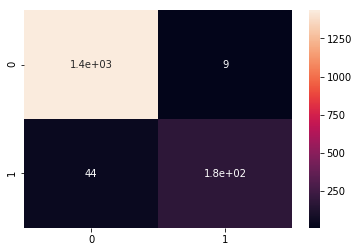

In [388]:
sns.heatmap(confusion_matrix(y_test, model_predict, labels=None, sample_weight=None), annot=True)

#### 3.6.1 Proabality Score for the classes

In [389]:
clf = XGBClassifier()
clf.fit(X_train_data_scaled, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train_data_scaled, y_train)
sig_clf_probs = sig_clf.predict_proba(X_test_data_scaled)

In [390]:
pd.DataFrame(sig_clf_probs).head(3)

,0,1
0,0.974606,0.025394
1,0.976771,0.023229
2,0.871506,0.128494


##### Example Datapoint for correctly classified points

In [391]:
test_point_index = 252
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 1
Predicted Class Probabilities: [[0.0092 0.9908]]
Actual Class : 1


##### Example Datapoint for correctly classified points

In [392]:
test_point_index = 1663
no_feature = 15
predicted_cls = sig_clf.predict(X_test_data_scaled.iloc[[test_point_index]])
print("Predicted Class :", predicted_cls[0])
print("Predicted Class Probabilities:", np.round(sig_clf.predict_proba(X_test_data_scaled.iloc[[test_point_index]]),4))
print("Actual Class :", y_test[test_point_index])

Predicted Class : 0
Predicted Class Probabilities: [[0.9692 0.0308]]
Actual Class : 1


## 4.7 Stacking the Models

In [393]:
lr = XGBClassifier()
sclf = StackingClassifier(classifiers=[NB_model, KNN_model, clf, RF_model, model ], meta_classifier=lr, use_probas=True)
sclf.fit(X_train_data_scaled, y_train)

StackingClassifier(average_probas=False,
          classifiers=[GaussianNB(priors=None), KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=3, p=2,
           weights='uniform'), XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, g...       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.6)],
          meta_classifier=XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1),
          store_train_meta_features=False, use_clones=True,
          use_features_in_secondary=False, use_probas=True, verbose=0

In [394]:
sclf_predict_train = sclf.predict(X_train_data_scaled)
sclf_predict = sclf.predict(X_test_data_scaled)

/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:
/Users/akash/anaconda3/lib/python3.6/site-packages/sklearn/preprocessing/label.py:151: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if diff:


In [395]:
print('Train Data')
precision, recall, fscore, support = score(y_train, sclf_predict_train, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((sclf_predict_train==y_train).sum() / len(sclf_predict_train), 3)))
print('Test Data')
precision, recall, fscore, support = score(y_test, sclf_predict, pos_label= 1, average='binary')
print('Precision: {} / Recall: {} /fscore : {} /Accuracy: {}'.format(round(precision, 3), round(recall, 3),\
                                                                     round(fscore,3),\
                                                         round((sclf_predict==y_test).sum() / len(sclf_predict), 3)))

Train Data
Precision: 1.0 / Recall: 1.0 /fscore : 1.0 /Accuracy: 1.0
Test Data
Precision: 0.938 / Recall: 0.812 /fscore : 0.871 /Accuracy: 0.968


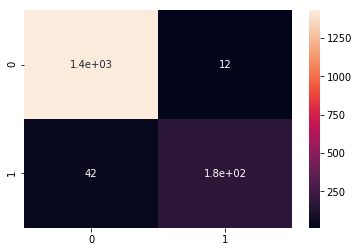

In [396]:
sns.heatmap(confusion_matrix(y_test, sclf_predict, labels=None, sample_weight=None), annot=True)

# 5. Comparison of performance of all the models

In [427]:
from prettytable import PrettyTable
from ipywidgets import *
import pandas as pd
df = pd.DataFrame({"Precision":[0.493,0.703,0.356,0.566,0.88,0.956,0.952,0.938],\
                   "Recall":[0.473,0.433,0.817,0.192,0.786,0.777,0.804,0.812], \
                   "Fscore":[0.483,0.536,0.496,0.287,0.83,0.857,0.872,0.871], \
                   "Accuracy":[0.864,0.899,0.777,0.872,0.957,0.965,0.968,0.968],\
                   "Model" : ['Naive Bayes' ,'KNN', 'Logis Regres(Class Balancing)','Logis Regres(without Class Balancing)',\
                             'Decision Tree' , 'Random Forest','XGBoost', "Stacking Classifier"]})
print(df)

   Accuracy  Fscore                                  Model  Precision  Recall
0     0.864   0.483                            Naive Bayes      0.493   0.473
1     0.899   0.536                                    KNN      0.703   0.433
2     0.777   0.496          Logis Regres(Class Balancing)      0.356   0.817
3     0.872   0.287  Logis Regres(without Class Balancing)      0.566   0.192
4     0.957   0.830                          Decision Tree      0.880   0.786
5     0.965   0.857                          Random Forest      0.956   0.777
6     0.968   0.872                                XGBoost      0.952   0.804
7     0.968   0.871                    Stacking Classifier      0.938   0.812


#### Looking at above comparison of models performance, we can say that XGBoost and Stacking Classifier are the best models based on Precision-Recall trade off. So, we cab pick any of those and perform modelling. Both will give almost same results.

***************************************************************************************************************************************************************************************************************************************************